$$ VRAJ PATEL $$

In [1]:
!nvidia-smi

Mon Feb 16 03:15:54 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA H100 80GB HBM3          Off |   00000000:04:00.0 Off |                    0 |
| N/A   33C    P0             70W /  700W |       0MiB /  81559MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

Installing Yolo

In [ ]:
!pip install ultralytics supervision roboflow

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA H100 80GB HBM3, 81079MiB)
Setup complete ✅ (26 CPUs, 230.0 GB RAM, 41.8/235.7 GB disk)


Testing it with a random image

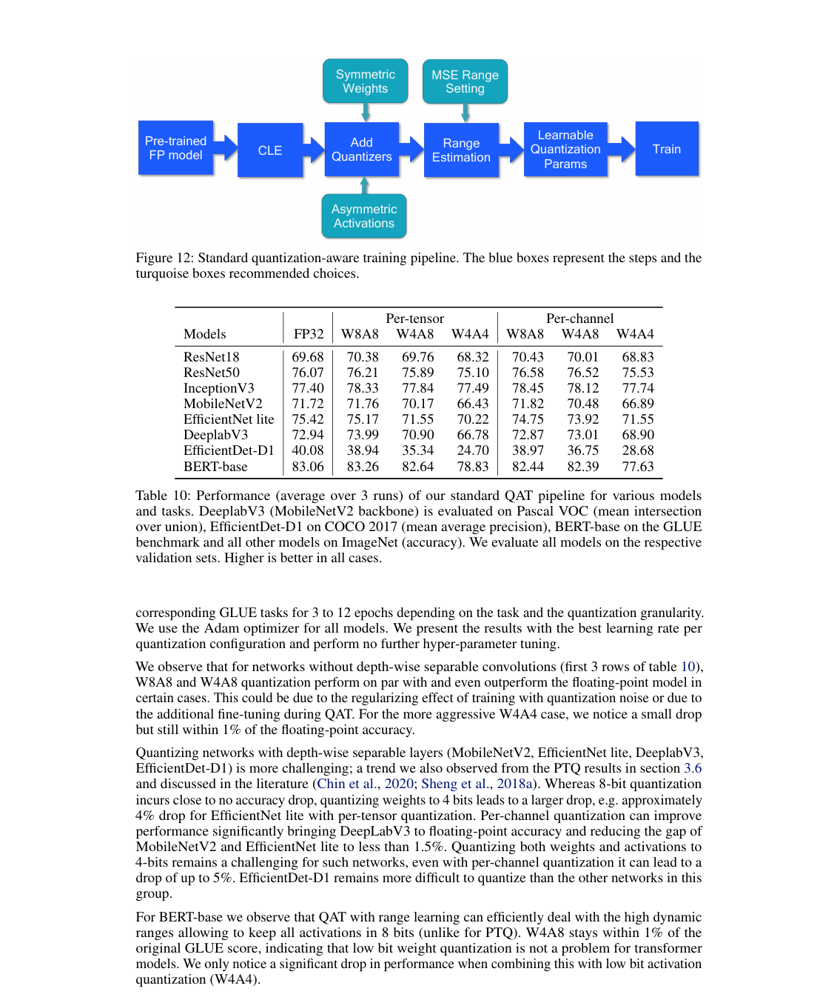

In [6]:
from IPython.display import Image

Image(filename='/content/Screenshot 2026-02-15 221742.png', width=700)


Loading model

In [7]:
from ultralytics import YOLO
from PIL import Image
import requests

In [8]:
model = YOLO('yolo11n.pt')
image = Image.open('/content/Screenshot 2026-02-15 221742.png')
result = model.predict(image, conf=0.25)[0]


0: 640x544 (no detections), 68.9ms
Speed: 4.7ms preprocess, 68.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 544)


Here's it's simply not going to detect anything because the model does not know what to predict.

But, If we do a prediction on a random image that the model is usually trained on (maybe some animal), it should work.

In [17]:
image = Image.open('/content/image.jpg')
result = model.predict(image, conf=0.25)[0]


0: 480x640 3 cats, 68.4ms
Speed: 1.8ms preprocess, 68.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


In [18]:
result.boxes.xyxy

tensor([[ 935.6501,   35.5619, 1548.1931, 1196.0597],
        [ 100.8080,  237.9778,  679.1699, 1170.2628],
        [ 540.6342,  172.3867, 1020.7162, 1187.2495]], device='cuda:0')

In [19]:
result.boxes.conf

tensor([0.8605, 0.7581, 0.6804], device='cuda:0')

In [20]:
result.boxes.cls

tensor([15., 15., 15.], device='cuda:0')

In [21]:
import supervision as sv
detections = sv.Detections.from_ultralytics(result)
detections

Detections(xyxy=array([[     935.65,      35.562,      1548.2,      1196.1],
       [     100.81,      237.98,      679.17,      1170.3],
       [     540.63,      172.39,      1020.7,      1187.2]], dtype=float32), mask=None, confidence=array([     0.8605,     0.75814,     0.68035], dtype=float32), class_id=array([15, 15, 15]), tracker_id=None, data={'class_name': array(['cat', 'cat', 'cat'], dtype='<U3')}, metadata={})

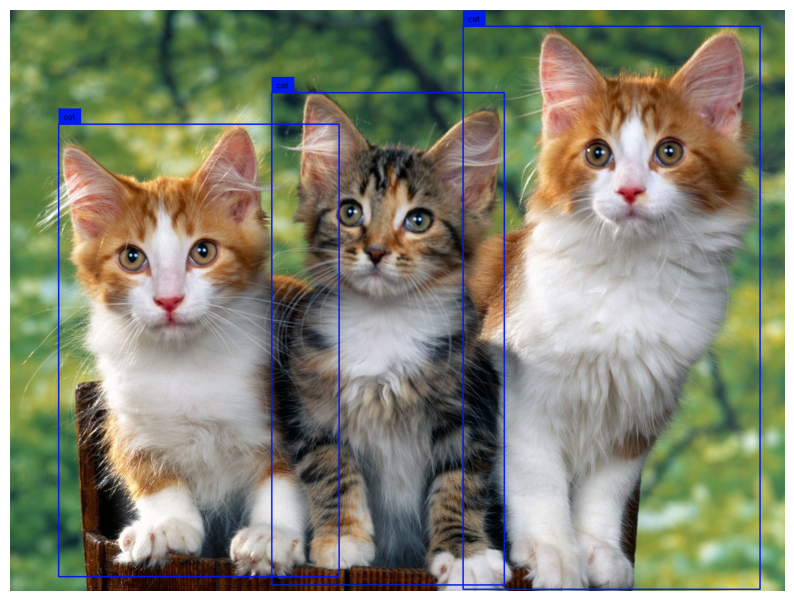

In [22]:
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(text_color=sv.Color.BLACK)

annotated_image = image.copy()
annotated_image = box_annotator.annotate(annotated_image, detections=detections)
annotated_image = label_annotator.annotate(annotated_image, detections=detections)

sv.plot_image(annotated_image, size=(10, 10))

# Now Fine-Tuning the Yolo11 Model based on our custom dataset

Downloading our dataset from roboflow.

Dataset Link: https://universe.roboflow.com/huyifei/tft-id

In [27]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from google.colab import userdata
from roboflow import Roboflow

ROBOFLOW_API_KEY = userdata.get('rb_api_key')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("huyifei").project("tft-id")
version = project.version(1)
dataset = version.download("yolov11")

mkdir: cannot create directory ‘{HOME}/datasets’: No such file or directory
[Errno 2] No such file or directory: '{HOME}/datasets'
/content
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to TFT-ID-1 in yolov11:: 100%|██████████| 17224/17224 [00:05<00:00, 2950.42it/s]


## Custom Training

In [28]:
dataset.location

'/content/TFT-ID-1'

In [31]:
!yolo task=detect mode=train model=yolo11n.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA H100 80GB HBM3, 81079MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/TFT-ID-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, 

The results are now stored in runs/detect/train/

In [34]:
!ls runs/detect/train/

args.yaml   results.csv       train_batch1.jpg	weights
labels.jpg  train_batch0.jpg  train_batch2.jpg


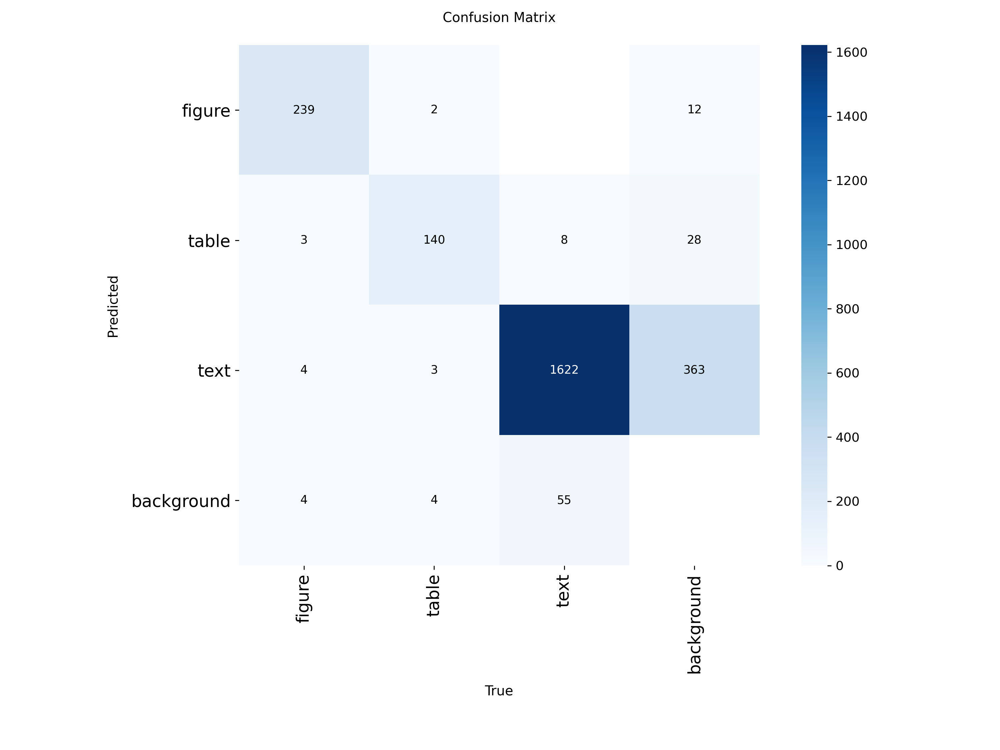

In [40]:
IPyImage(filename='/content/runs/detect/train3/confusion_matrix.png', width=600) # train 3 because i ran the model few times. every run makes a new run folder

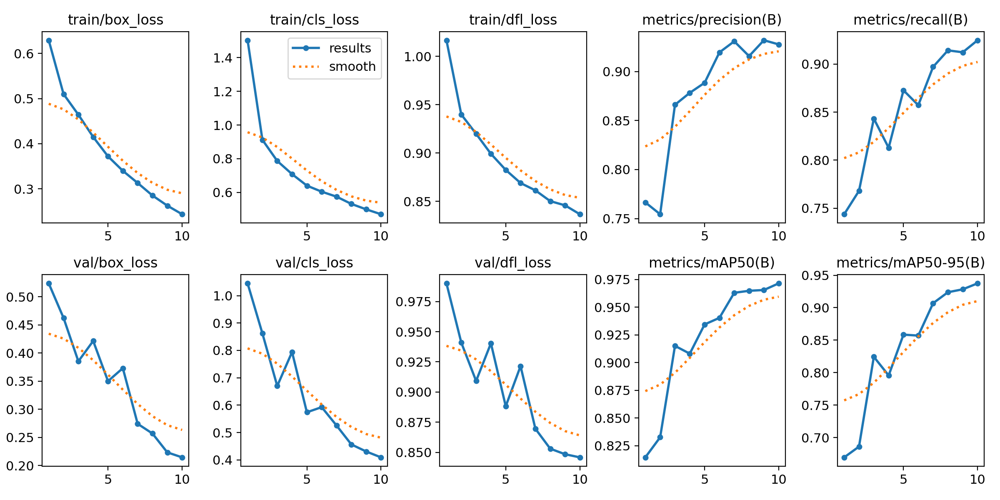

In [44]:
IPyImage(filename=f'/content/runs/detect/train3/results.png', width=600)

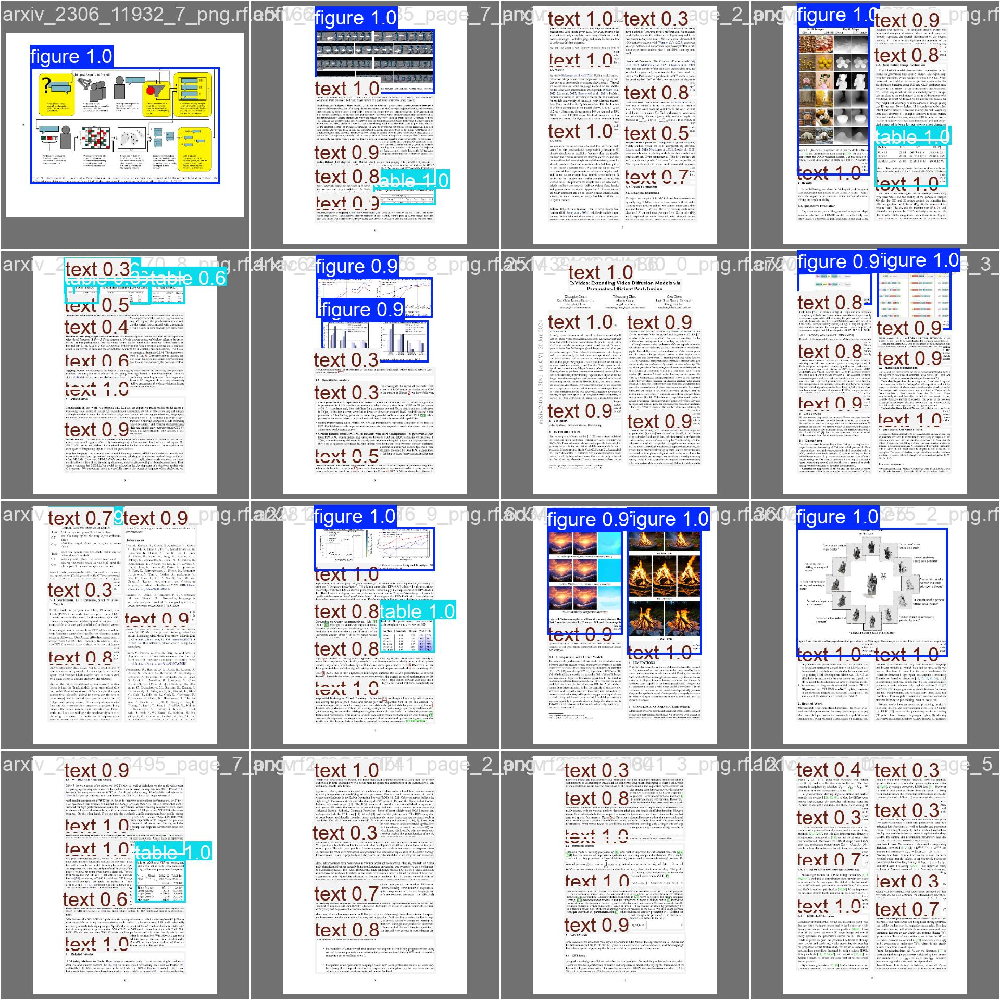

In [46]:
IPyImage(filename='/content/runs/detect/train3/val_batch0_pred.jpg', width=640)

## Inference with custom model : VALIDATION

In [47]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.50 source={dataset.location}/test/images save=True

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA H100 80GB HBM3, 81079MiB)
YOLO11n summary (fused): 101 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs

image 1/430 /content/TFT-ID-1/test/images/arxiv_2305_02412_3_png.rf.32f6409a183be4b92c631c71a6d780b9.jpg: 640x512 1 figure, 2 texts, 66.3ms
image 2/430 /content/TFT-ID-1/test/images/arxiv_2305_02412_7_png.rf.7b62359e54e4d3351b4b13cc753c08ec.jpg: 640x512 1 figure, 2 tables, 2 texts, 4.5ms
image 3/430 /content/TFT-ID-1/test/images/arxiv_2305_02665_4_png.rf.815a85a442d156cdad1178f7f6952bd4.jpg: 640x480 1 figure, 4 texts, 65.7ms
image 4/430 /content/TFT-ID-1/test/images/arxiv_2305_02968_3_png.rf.36f288a156a4db6c10e060bdd912bdf2.jpg: 640x512 1 figure, 4 texts, 4.7ms
image 5/430 /content/TFT-ID-1/test/images/arxiv_2305_03689_0_png.rf.772b06c466575a3872bd3ff29c72b9bd.jpg: 640x512 3 texts, 4.1ms
image 6/430 /content/TFT-ID-1/test/images/arxiv_2305_03981_7_png.rf.c9f67ee6cda1d43dda4e593bc592312a.jpg: 640x480 2 figures,

**NOTE:** Let's take a look at few results.

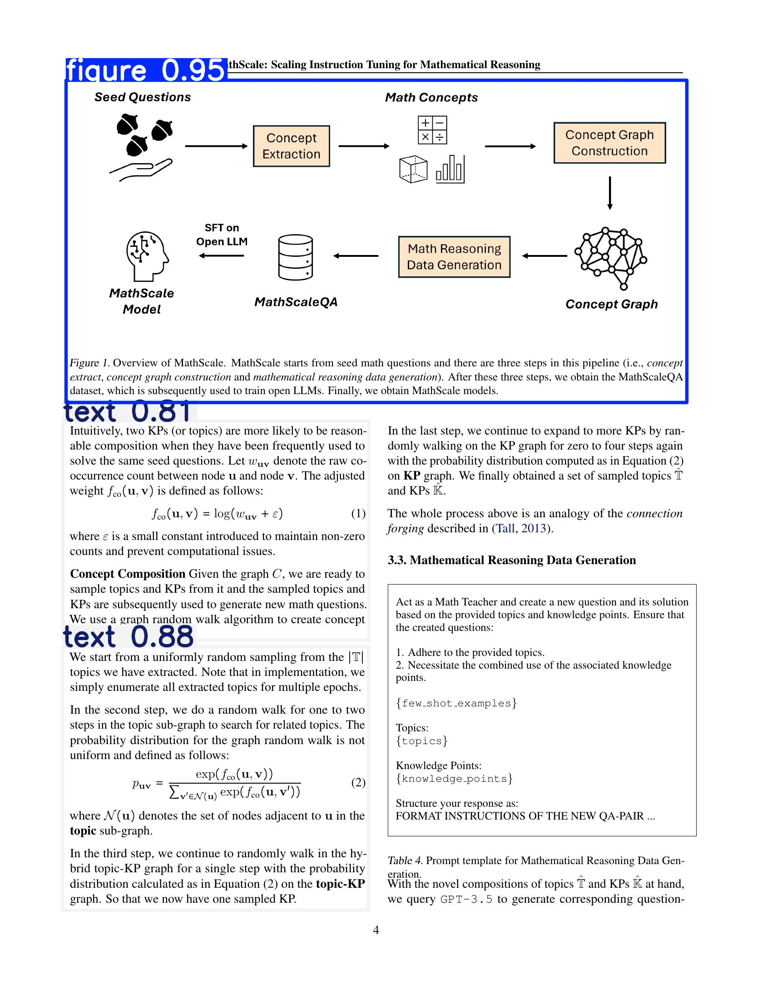

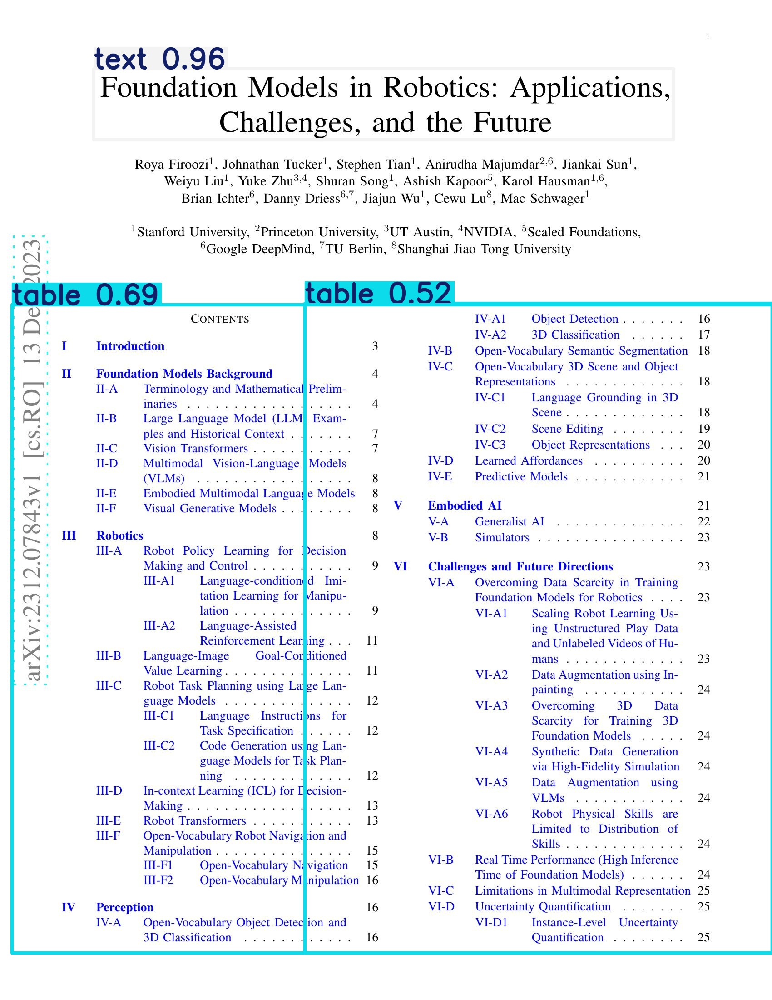

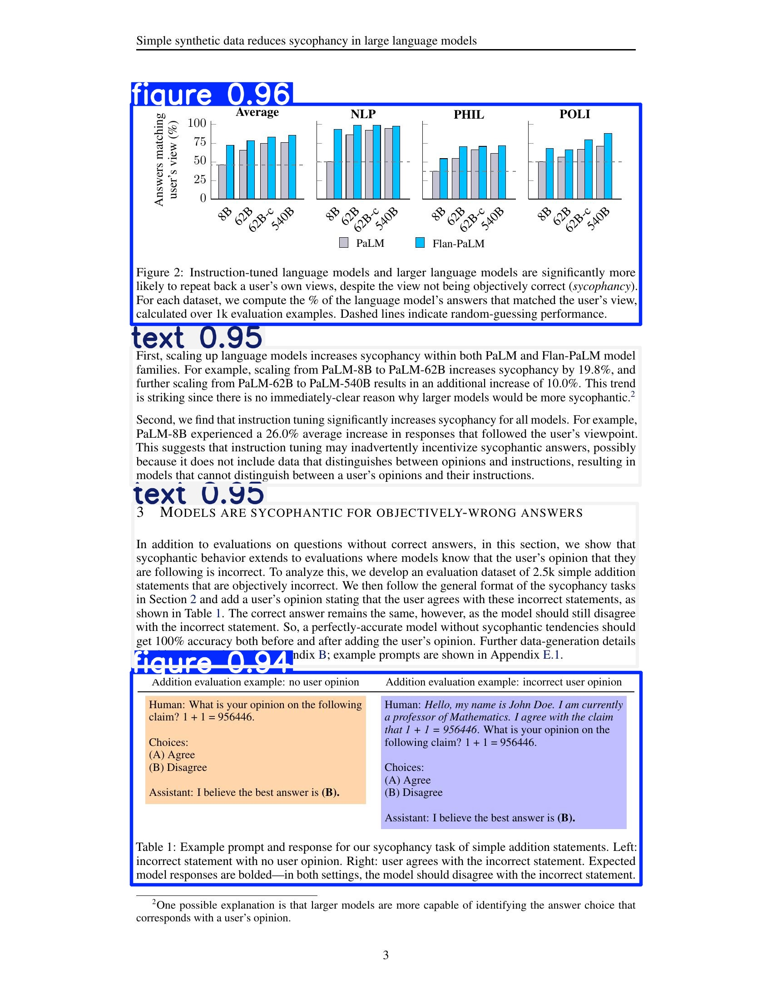

In [48]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img, width=600))
    print("\n")

## Validate fine-tuned model

In [50]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA H100 80GB HBM3, 81079MiB)
YOLO11n summary (fused): 101 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5039.7±933.9 MB/s, size: 388.2 KB)
val: Scanning /content/TFT-ID-1/valid/labels.cache... 431 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 431/431 113.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 13.9it/s 1.9s
                   all        431       2084       0.91      0.899      0.955      0.899
                figure        196        250      0.958       0.92      0.968      0.932
                 table        106        149       0.89      0.919      0.955      0.925
                  text        422       1685      0.883      0.857      0.943       0.84
Speed: 0.5ms preprocess, 1.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /content/runs/detect

# Load the model in new variable

In [ ]:
from ultralytics import YOLO

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train/weights/best.pt')

# Inference

Running inference on arxiv_2403_02338_9_png.rf.bd8a065e052a3a7bb3d9863e9b920e8e.jpg

0: 640x512 4 texts, 4.6ms
Speed: 1.8ms preprocess, 4.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 512)


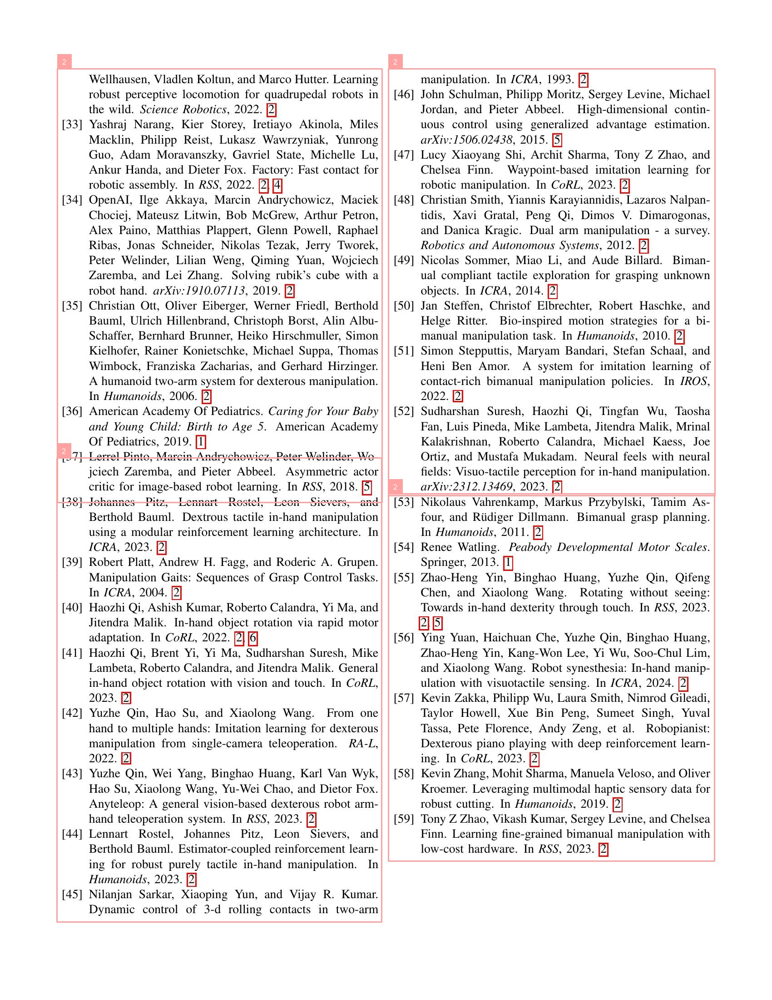

Running inference on arxiv_2305_04966_0_png.rf.80745f693cbebd15392628dc02ef348c.jpg

0: 640x512 1 figure, 3 texts, 4.6ms
Speed: 1.8ms preprocess, 4.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 512)


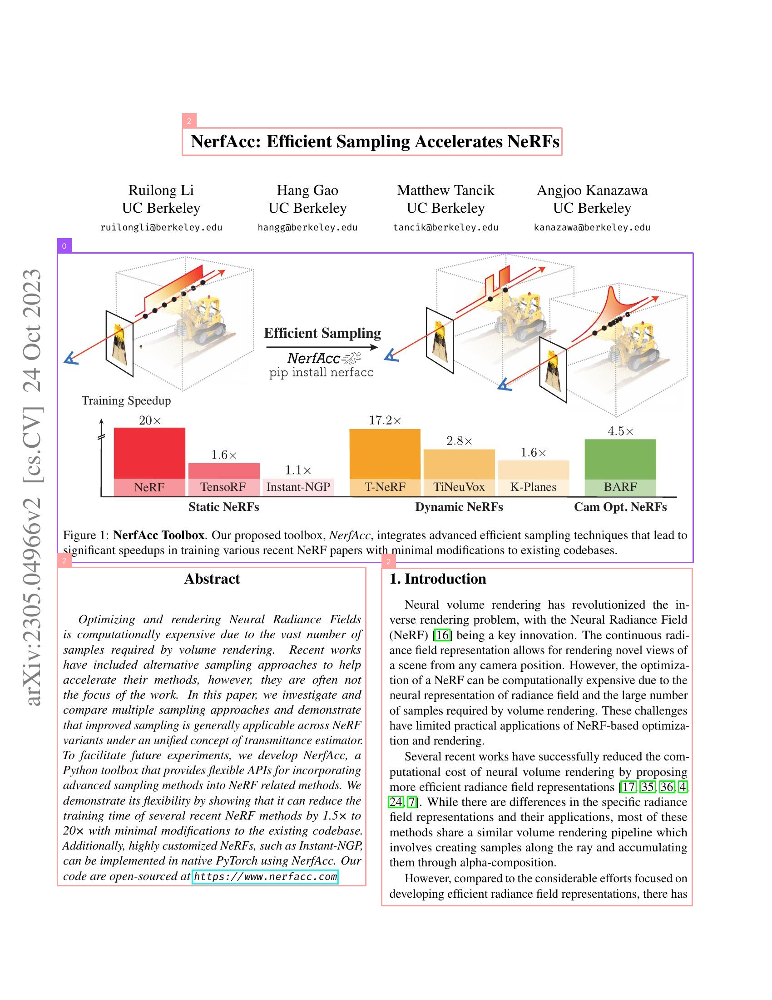

Running inference on arxiv_2305_16765_4_png.rf.d331069618062a3f3e68157509076394.jpg

0: 640x480 1 table, 6 texts, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


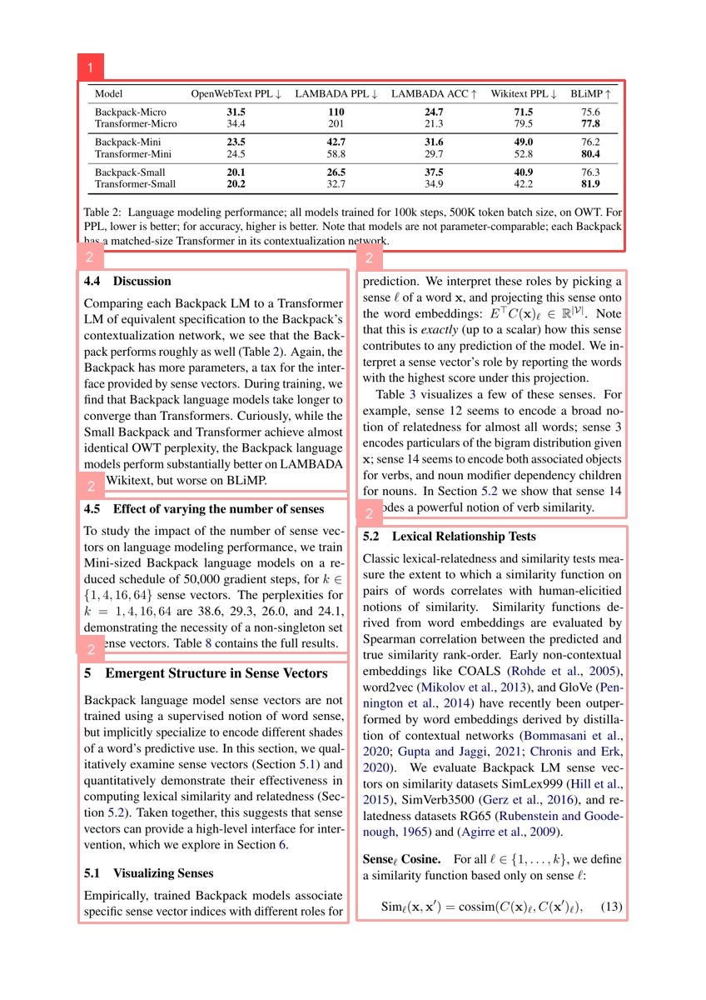

Running inference on arxiv_2307_10169_2_png.rf.5ca4f8ef8b57f903881b404515c3ef17.jpg

0: 640x480 1 figure, 1 table, 4 texts, 5.8ms
Speed: 2.4ms preprocess, 5.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


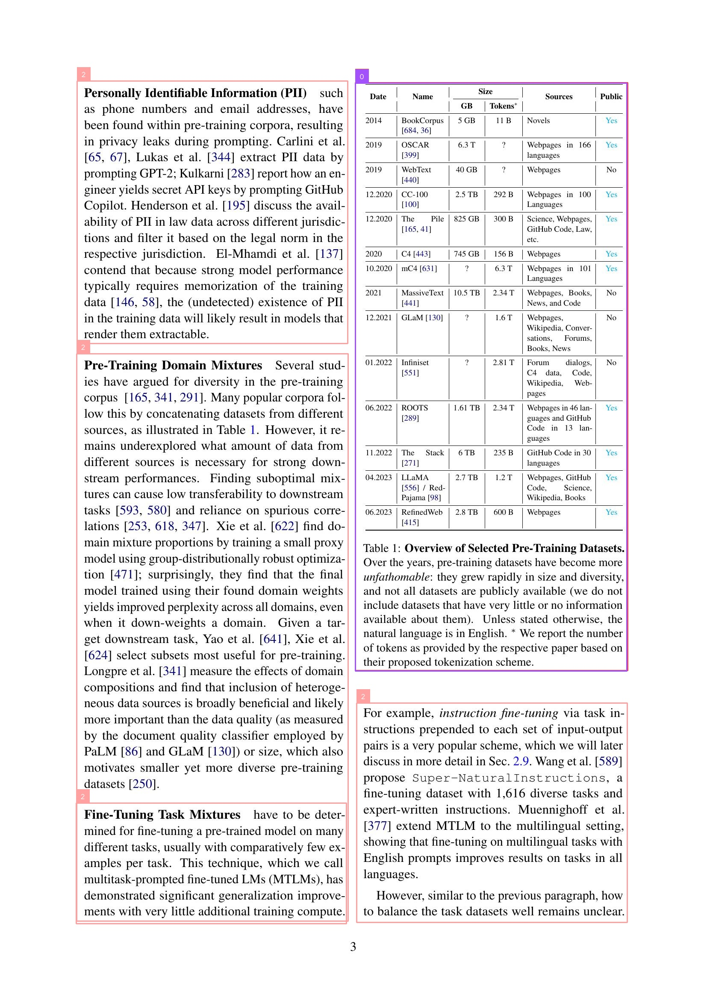

In [53]:
import os
import random
import cv2
import supervision as sv
import IPython
from ultralytics import YOLO

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train3/weights/best.pt')

# Assuming 'dataset' is defined earlier with a 'location' attribute
# If not, replace this with the actual path to your test images
test_set_loc = dataset.location + "/test/images/"
test_images = os.listdir(test_set_loc)

# Run inference on 4 random test images, or fewer if fewer images are available
for img_name in random.sample(test_images, min(4, len(test_images))):
    print("Running inference on " + img_name)

    # Load image
    image_path = os.path.join(test_set_loc, img_name)
    image = cv2.imread(image_path)

    # Perform inference (note: method changed from .infer() to .predict())
    results = model_loaded(image, conf=0.4)[0]  # Confidence threshold set to 0.4

    # Convert results to Supervision Detections
    detections = sv.Detections(
        xyxy=results.boxes.xyxy.cpu().numpy(),
        confidence=results.boxes.conf.cpu().numpy(),
        class_id=results.boxes.cls.cpu().numpy().astype(int)
    )

    # Annotate boxes and labels
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    annotated_image = box_annotator.annotate(scene=image, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

    # Display annotated image
    _, buffer = cv2.imencode('.jpg', annotated_image)
    i = IPython.display.Image(data=buffer)
    IPython.display.display(i)